In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
!pip install lime

In [ ]:
import lime

LOADING THE DATASET

In [ ]:
df=pd.read_csv("/content/drive/MyDrive/new_dataset/healthcare-dataset-stroke-data.csv")

In [ ]:
df.head(5)

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,9046,Male,67.0,0,1,Yes,Private,Urban,228.69,36.6,formerly smoked,Yes
1,51676,Female,61.0,0,0,Yes,Self-employed,Rural,202.21,NaN,never smoked,Yes
2,31112,Male,80.0,0,1,Yes,Private,Rural,105.92,32.5,never smoked,Yes
3,60182,Female,49.0,0,0,Yes,Private,Urban,171.23,34.4,smokes,Yes
4,1665,Female,79.0,1,0,Yes,Self-employed,Rural,174.12,24.0,never smoked,Yes


In [ ]:
df=df.dropna()

In [ ]:
df=df.drop_duplicates()

In [ ]:
df.shape

(4909, 12)

ENCODING

In [ ]:
from sklearn import preprocessing
label_encoder = preprocessing.LabelEncoder()
df['stroke']=label_encoder.fit_transform(df['stroke'])
df['smoking_status']=label_encoder.fit_transform(df['smoking_status'])
df['Residence_type']=label_encoder.fit_transform(df['Residence_type'])
df['work_type']=label_encoder.fit_transform(df['work_type'])
df['gender']=label_encoder.fit_transform(df['gender'])
df['ever_married']=label_encoder.fit_transform(df['ever_married'])

In [ ]:
df.head(5)

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,9046,1,67.0,0,1,1,2,1,228.69,36.6,1,1
2,31112,1,80.0,0,1,1,2,0,105.92,32.5,2,1
3,60182,0,49.0,0,0,1,2,1,171.23,34.4,3,1
4,1665,0,79.0,1,0,1,3,0,174.12,24.0,2,1
5,56669,1,81.0,0,0,1,2,1,186.21,29.0,1,1


DROPPING 'ID' COLUMN

In [ ]:
df=df.drop(["id"],axis=1)

In [ ]:
df

,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,1,67.0,0,1,1,2,1,228.69,36.6,1,1
2,1,80.0,0,1,1,2,0,105.92,32.5,2,1
3,0,49.0,0,0,1,2,1,171.23,34.4,3,1
4,0,79.0,1,0,1,3,0,174.12,24.0,2,1
5,1,81.0,0,0,1,2,1,186.21,29.0,1,1
...,...,...,...,...,...,...,...,...,...,...,...
5104,0,13.0,0,0,0,4,0,103.08,18.6,0,0
5106,0,81.0,0,0,1,3,1,125.20,40.0,2,0
5107,0,35.0,0,0,1,3,0,82.99,30.6,2,0
5108,1,51.0,0,0,1,2,0,166.29,25.6,1,0


NORMALIZATION

In [ ]:
df.columns

Index(['gender', 'age', 'hypertension', 'heart_disease', 'ever_married',
       'work_type', 'Residence_type', 'avg_glucose_level', 'bmi',
       'smoking_status', 'stroke'],
      dtype='object')

In [ ]:
columns=['gender', 'age', 'hypertension', 'heart_disease', 'ever_married',
       'work_type', 'Residence_type', 'avg_glucose_level', 'bmi',
       'smoking_status']

In [ ]:
from sklearn.preprocessing import StandardScaler
StandardScaler = StandardScaler()
columns_to_scale = columns
df[columns_to_scale]= StandardScaler.fit_transform(df[columns_to_scale])

In [ ]:
df

,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,1.198428,1.070138,-0.318067,4.381968,0.729484,-0.155697,0.985640,2.777698,0.981345,-0.351788,1
2,1.198428,1.646563,-0.318067,4.381968,0.729484,-0.155697,-1.014569,0.013842,0.459269,0.585232,1
3,-0.833023,0.272012,-0.318067,-0.228208,0.729484,-0.155697,0.985640,1.484132,0.701207,1.522252,1
4,-0.833023,1.602222,3.143994,-0.228208,0.729484,0.759651,-1.014569,1.549193,-0.623083,0.585232,1
5,1.198428,1.690903,-0.318067,-0.228208,0.729484,-0.155697,0.985640,1.821368,0.013595,-0.351788,1
...,...,...,...,...,...,...,...,...,...,...,...
5104,-0.833023,-1.324241,-0.318067,-0.228208,-1.370831,1.674998,-1.014569,-0.050094,-1.310695,-1.288808,0
5106,-0.833023,1.690903,-0.318067,-0.228208,0.729484,0.759651,0.985640,0.447882,1.414286,0.585232,0
5107,-0.833023,-0.348753,-0.318067,-0.228208,0.729484,0.759651,-1.014569,-0.502369,0.217332,0.585232,0
5108,1.198428,0.360692,-0.318067,-0.228208,0.729484,-0.155697,-1.014569,1.372920,-0.419346,-0.351788,0


END OF NORMALIZATION

In [ ]:
X=df.drop('stroke',axis=1)
Y=df['stroke']

In [ ]:
X

,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status
0,1.198428,1.070138,-0.318067,4.381968,0.729484,-0.155697,0.985640,2.777698,0.981345,-0.351788
2,1.198428,1.646563,-0.318067,4.381968,0.729484,-0.155697,-1.014569,0.013842,0.459269,0.585232
3,-0.833023,0.272012,-0.318067,-0.228208,0.729484,-0.155697,0.985640,1.484132,0.701207,1.522252
4,-0.833023,1.602222,3.143994,-0.228208,0.729484,0.759651,-1.014569,1.549193,-0.623083,0.585232
5,1.198428,1.690903,-0.318067,-0.228208,0.729484,-0.155697,0.985640,1.821368,0.013595,-0.351788
...,...,...,...,...,...,...,...,...,...,...
5104,-0.833023,-1.324241,-0.318067,-0.228208,-1.370831,1.674998,-1.014569,-0.050094,-1.310695,-1.288808
5106,-0.833023,1.690903,-0.318067,-0.228208,0.729484,0.759651,0.985640,0.447882,1.414286,0.585232
5107,-0.833023,-0.348753,-0.318067,-0.228208,0.729484,0.759651,-1.014569,-0.502369,0.217332,0.585232
5108,1.198428,0.360692,-0.318067,-0.228208,0.729484,-0.155697,-1.014569,1.372920,-0.419346,-0.351788


In [ ]:
Y

0       1
2       1
3       1
4       1
5       1
       ..
5104    0
5106    0
5107    0
5108    0
5109    0
Name: stroke, Length: 4909, dtype: int64

TRAIN-TEST SPLIT

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test,y_train, y_test=train_test_split(X,Y,test_size=0.3,random_state=42)

print('X_train-', X_train.size)
print('X_test-',X_test.size)
print('y_train-', y_train.size)
print('y_test-', y_test.size)

X_train- 34360
X_test- 14730
y_train- 3436
y_test- 1473


SMOTE

In [ ]:
from imblearn.over_sampling import SMOTE
sm=SMOTE(random_state=42)
X_res,Y_res=sm.fit_resample(X_train,y_train)

In [ ]:
np.bincount(Y_res)

array([3299, 3299])

In [ ]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn import metrics
from sklearn.metrics import classification_report

In [ ]:
from sklearn.ensemble import RandomForestClassifier
rfc=RandomForestClassifier(max_depth=10,n_estimators=100)
mrfc=rfc.fit(X_res,Y_res)
p=mrfc.predict(X_test)
cmat=confusion_matrix(y_test,p)
cmat

array([[1249,  152],
       [  47,   25]])

In [ ]:
import seaborn as sns

<Axes: >

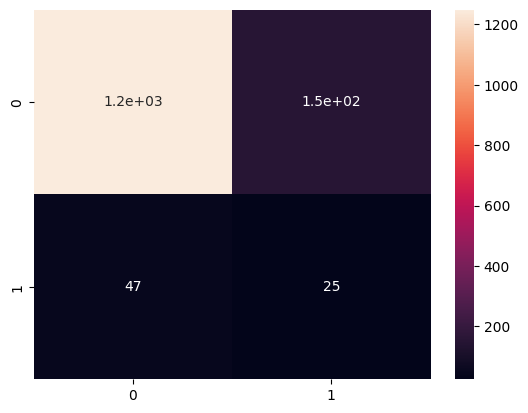

In [ ]:
sns.heatmap(cmat,annot=True,cmap="rocket")

In [ ]:
print(classification_report(y_test,p))

              precision    recall  f1-score   support

           0       0.96      0.89      0.93      1401
           1       0.14      0.35      0.20        72

    accuracy                           0.86      1473
   macro avg       0.55      0.62      0.56      1473
weighted avg       0.92      0.86      0.89      1473



In [ ]:
print("Accuracy Score : ",accuracy_score(y_test,p))

Accuracy Score :  0.8649015614392397


In [ ]:
list=[]

In [ ]:
def accuracy(a,b):
  p=accuracy_score(a,b)
  return p

In [ ]:
r=accuracy(y_test,p)
r

0.8649015614392397

In [ ]:
list.append(r)

In [ ]:
list

[0.8649015614392397]

NOW LIME (Local Interpretable Model-Agnostic Explanations

In [ ]:
from lime import lime_tabular

interpreter= lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_res),
    feature_names=X_res.columns,
    mode='classification'
)

In [ ]:
exp=interpreter.explain_instance(
    data_row=X_test.iloc[3],
    predict_fn=mrfc.predict_proba
)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


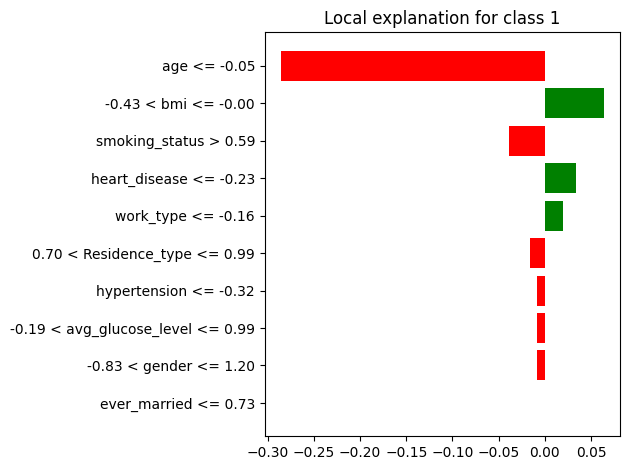

In [ ]:
plt = exp.as_pyplot_figure()
plt.tight_layout()
exp.show_in_notebook(show_table=True)

TRYING WITH OTHER ALGORITHMS

#LOGISTIC REGRESSION

In [ ]:
from sklearn.linear_model import LogisticRegression
lr=LogisticRegression()
model3=lr.fit(X_res,Y_res)
predLR=model3.predict(X_test)

cmlr=confusion_matrix(y_test,predLR)

cmlr

array([[1025,  376],
       [  11,   61]])

<Axes: >

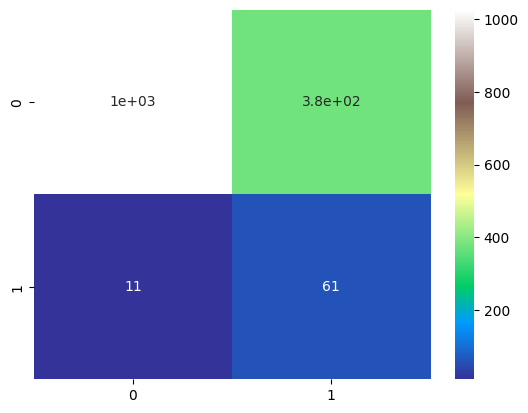

In [ ]:
sns.heatmap(cmlr,annot=True,cmap="terrain")

In [ ]:
print("Accuracy Score : ",accuracy_score(y_test,predLR))

Accuracy Score :  0.7372708757637475


In [ ]:
l=accuracy(y_test,predLR)
l

0.7372708757637475

In [ ]:
list.append(l)

In [ ]:
exp1=interpreter.explain_instance(
    data_row=X_test.iloc[3],
    predict_fn=model3.predict_proba
)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


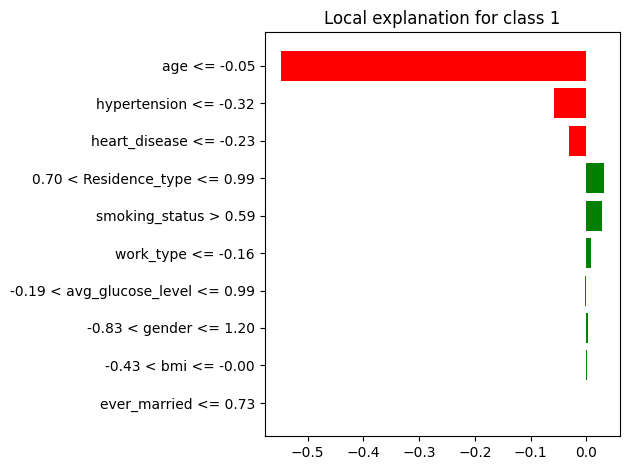

In [ ]:
plt1 = exp1.as_pyplot_figure()
plt1.tight_layout()
exp1.show_in_notebook(show_table=True)

Support Vector Machine

In [ ]:
from sklearn.svm import SVC
svm=SVC(C=1,kernel='linear',gamma='auto',probability=True)
modelSVC=svm.fit(X_res,Y_res)
predictionSVC=modelSVC.predict(X_test)
cmSVC= confusion_matrix(y_test,predictionSVC)
cmSVC

array([[997, 404],
       [ 11,  61]])

<Axes: >

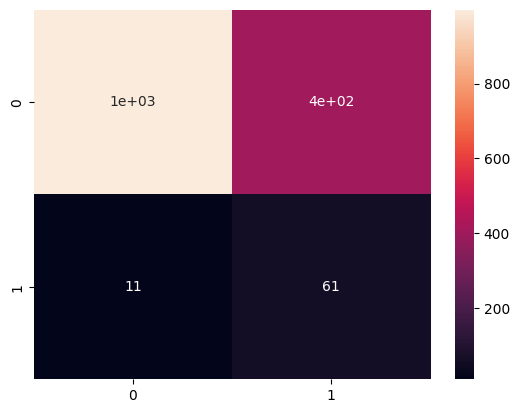

In [ ]:
sns.heatmap(cmSVC,annot=True,cmap="rocket")

In [ ]:
print("Accuracy Score : ",accuracy_score(y_test,predictionSVC))

Accuracy Score :  0.7182620502376104


In [ ]:
s=accuracy(y_test,predictionSVC)
s

0.7182620502376104

In [ ]:
list.append(s)

In [ ]:
exp2=interpreter.explain_instance(
    data_row=X_test.iloc[4],
    predict_fn=modelSVC.predict_proba
)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


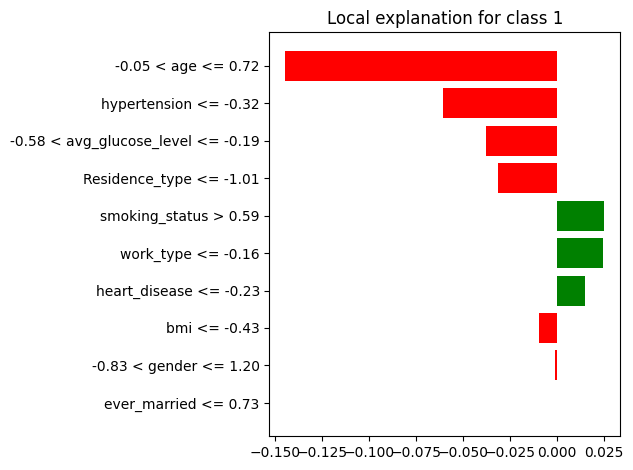

In [ ]:
plt2 = exp2.as_pyplot_figure()
plt2.tight_layout()
exp2.show_in_notebook(show_table=True)

XGBOOST

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
x=GradientBoostingClassifier(learning_rate=0.1,n_estimators=100)
modelx=x.fit(X_res,Y_res)
predx=modelx.predict(X_test)
cmx=confusion_matrix(y_test,predx)
cmx

array([[1305,   96],
       [  49,   23]])

In [ ]:
print("Accuracy Score : ",accuracy_score(y_test,predx))

Accuracy Score :  0.9015614392396469


In [ ]:
x=accuracy(y_test,predx)
x

0.9015614392396469

In [ ]:
list.append(x)

In [ ]:
exp3=interpreter.explain_instance(
    data_row=X_test.iloc[200],
    predict_fn=modelx.predict_proba
)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(


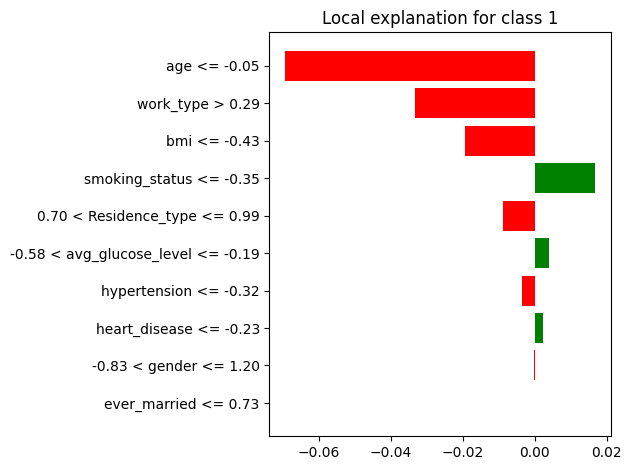

In [ ]:
plt3 = exp3.as_pyplot_figure()
plt3.tight_layout()
exp3.show_in_notebook(show_table=True)

DECISION TREE

In [ ]:
from sklearn.tree import DecisionTreeClassifier
dt=DecisionTreeClassifier()
m=dt.fit(X_res,Y_res)
predictor=m.predict(X_test)
cm=confusion_matrix(y_test,predictor)
cm

array([[1304,   97],
       [  57,   15]])

<Axes: >

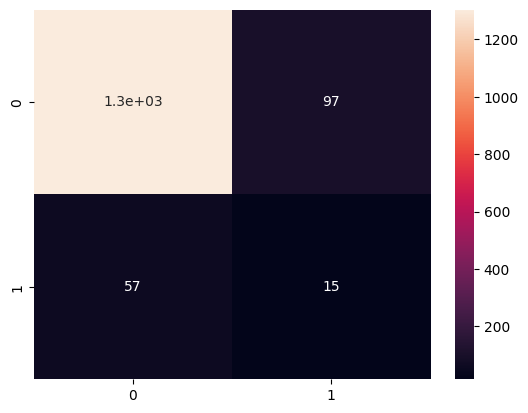

In [ ]:
sns.heatmap(cm,annot=True,cmap="rocket")

In [ ]:
d=accuracy(y_test,predictor)
d

0.8954514596062457

In [ ]:
list.append(d)

In [ ]:
exp4=interpreter.explain_instance(
    data_row=X_test.iloc[5],
    predict_fn=m.predict_proba
)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


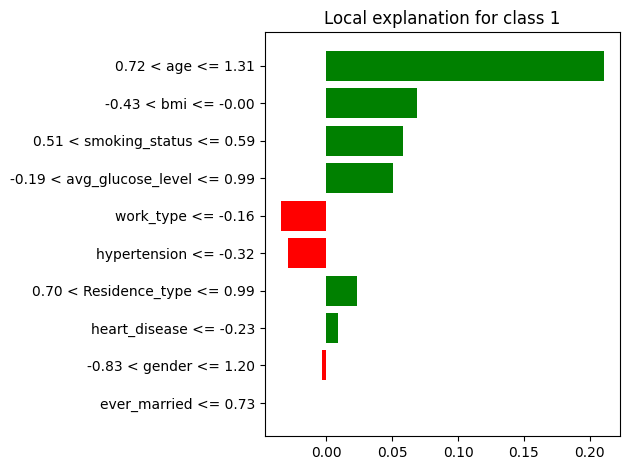

In [ ]:
plt4 = exp4.as_pyplot_figure()
plt4.tight_layout()
exp4.show_in_notebook(show_table=True)

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
KNN=KNeighborsClassifier()
modelk=KNN.fit(X_res,Y_res)
predk= modelk.predict(X_test)
c=confusion_matrix(y_test,predk)
c

array([[1192,  209],
       [  46,   26]])

In [ ]:
acckn=accuracy_score(y_test,predk)
list.append(acckn)

In [ ]:
exp5=interpreter.explain_instance(
    data_row=X_test.iloc[5],
    predict_fn=modelk.predict_proba
)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(


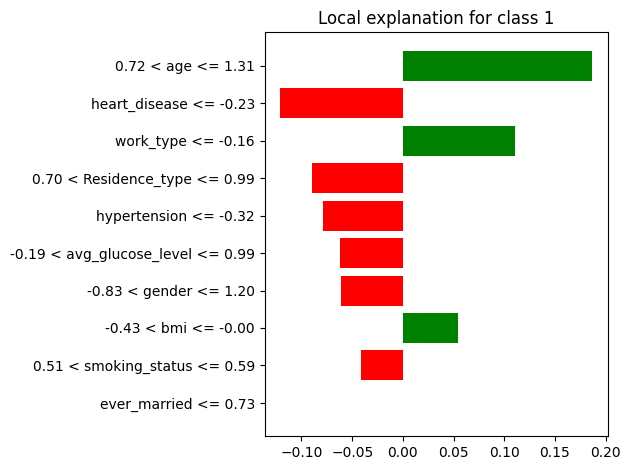

In [ ]:
plt5 = exp5.as_pyplot_figure()
plt5.tight_layout()
exp5.show_in_notebook(show_table=True)

In [ ]:
list

[0.8649015614392397,
 0.7372708757637475,
 0.7182620502376104,
 0.9015614392396469,
 0.8954514596062457,
 0.8268839103869654]

SHAP

FOR XGBOOST

In [ ]:
!pip install shap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 572.6/572.6 kB 17.6 MB/s eta 0:00:00


In [ ]:
import shap

In [ ]:
explainer = shap.TreeExplainer(modelx) #XGboost

In [ ]:
shap_values = explainer.shap_values(X_test)

In [ ]:
shap_values

array([[ 5.82154897e-04,  1.38606606e+00, -1.63266863e-02, ...,
        -6.35963867e-02, -3.49843680e-01, -1.34637184e+00],
       [ 1.15238461e-02, -1.52034515e+00,  1.35458563e-02, ...,
        -8.80747907e-03,  1.07080974e-01, -6.26805833e-01],
       [-7.57497288e-02,  1.05251428e+00,  1.77929283e-03, ...,
        -4.43325585e-02, -8.70855085e-02, -6.32199375e-01],
       ...,
       [ 5.24180948e-03,  1.51399678e+00, -1.75494172e-02, ...,
        -6.33573620e-02,  3.65899649e-02, -7.02896259e-01],
       [ 7.01323397e-03, -2.51126099e+00,  1.57564923e-02, ...,
        -2.21404823e-01, -2.46806900e-01, -7.19741944e-01],
       [-5.71415913e-03,  6.56197948e-01,  7.83434477e-03, ...,
        -4.67209619e-02,  2.34971460e-01, -9.31272861e-01]])

In [ ]:
shap_values.shape

(1473, 10)

In [ ]:
shap.initjs()
#shap.force_plot(explainer.expected_value[0], shap_values[1][0,:], X_test.iloc[0,:])
shap.force_plot(explainer.expected_value, shap_values[0], X_test.iloc[0, :])

In [ ]:
import shap

shap.initjs()
# Create a SHAP explainer
explainer = shap.Explainer(modelx)


shap_values = explainer.shap_values(X_test)


num_features = X_test.shape[1]
X_test_subset = X_test.iloc[:, :num_features]


instance_index = 4
shap.force_plot(explainer.expected_value[0], shap_values[instance_index, :], X_test_subset.iloc[instance_index, :])


No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


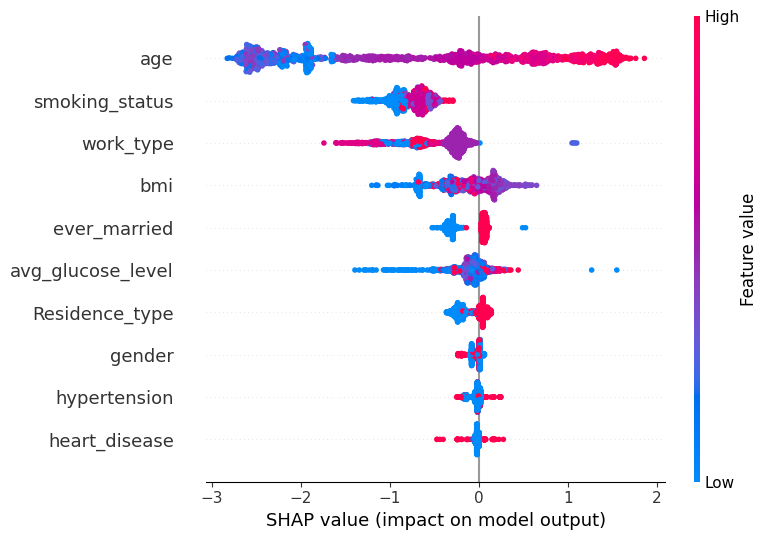

In [ ]:
#shap.summary_plot(shap_values, X_test)
c_values = np.random.rand(X_test.shape[0])  # Replace with your own color values

# Generate the summary plot with custom colors
shap.summary_plot(shap_values, X_test, color=c_values)

FEED FORWARD NETWORK (FNN)

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

In [ ]:
model = Sequential()

model.add(Dense(64, activation='relu', input_shape=(X_res.shape[1],)))
model.add(Dense(128, activation='relu'))
model.add(Dense(64, activation='relu'))
model.add(Dense(64,activation='relu'))
model.add(Dense(1, activation='sigmoid'))

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.fit(X_res, Y_res, epochs=500, batch_size=32)

loss, accuracy = model.evaluate(X_test, y_test)

print('Test Loss:', loss)
print('Test Accuracy:', accuracy)

In [ ]:
list.append(accuracy)
list

[0.8649015614392397,
 0.7372708757637475,
 0.7182620502376104,
 0.9015614392396469,
 0.8954514596062457,
 0.8268839103869654,
 0.914460301399231]

In [ ]:
y_predict=model.predict(X_test)
y_predict

47/47 [==============================] - 0s 2ms/step


array([[1.5703830e-17],
       [8.3519619e-17],
       [1.2863431e-13],
       ...,
       [1.3238870e-09],
       [1.1279192e-34],
       [4.7431004e-04]], dtype=float32)

In [ ]:
import seaborn as sns

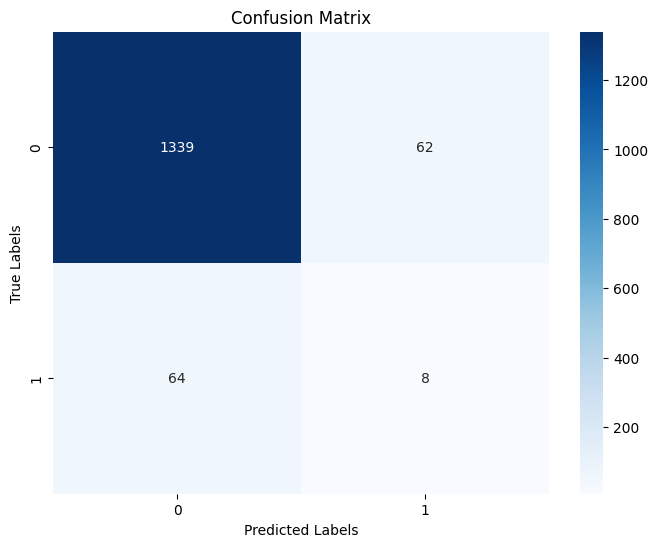

In [ ]:
y_pred_classes = np.round(y_predict)
cm = confusion_matrix(y_test, y_pred_classes)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

GAUSSIAN NAIVE BAYES

In [ ]:
from sklearn.naive_bayes import GaussianNB
NB=GaussianNB()
modelNV=NB.fit(X_res,Y_res)
predictionnb=modelNV.predict(X_test)
cNV=confusion_matrix(y_test,predictionnb)
cNV

array([[1006,  395],
       [  18,   54]])

<Axes: >

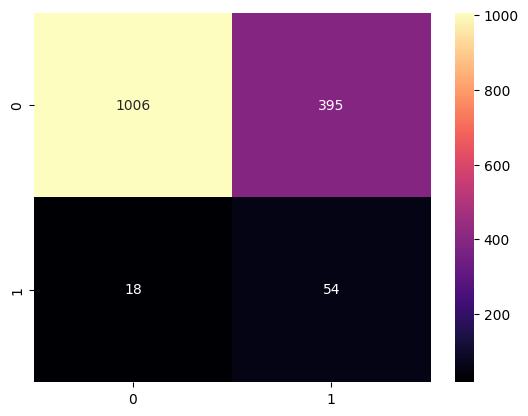

In [ ]:
sns.heatmap(cNV, annot=True,fmt='d', cmap='magma')

In [ ]:
n=accuracy_score(y_test,predictionnb)
n

0.7196198234894773

In [ ]:
exp6=interpreter.explain_instance(
    data_row=X_test.iloc[7],
    predict_fn=modelNV.predict_proba
)

X does not have valid feature names, but GaussianNB was fitted with feature names


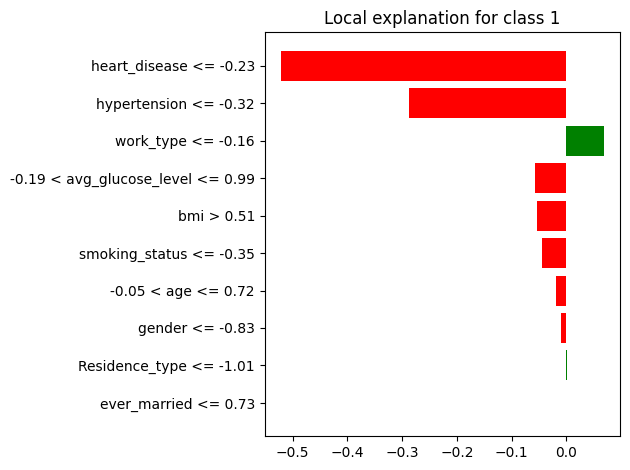

In [ ]:
plt6 = exp6.as_pyplot_figure()
plt6.tight_layout()
exp6.show_in_notebook(show_table=True)

In [ ]:
list.append(n)
list

[0.8649015614392397,
 0.7372708757637475,
 0.7182620502376104,
 0.9015614392396469,
 0.8954514596062457,
 0.8268839103869654,
 0.914460301399231,
 0.7196198234894773]

In [ ]:
algorithms=['Random Forest', 'Logistic Regression','Support Vector Machine','XGBoost', 'Decision Tree','KNN','Deep Neural Network','Naive Bayes']

In [ ]:
list

[0.8649015614392397,
 0.7372708757637475,
 0.7182620502376104,
 0.9015614392396469,
 0.8954514596062457,
 0.8268839103869654,
 0.914460301399231,
 0.7196198234894773]

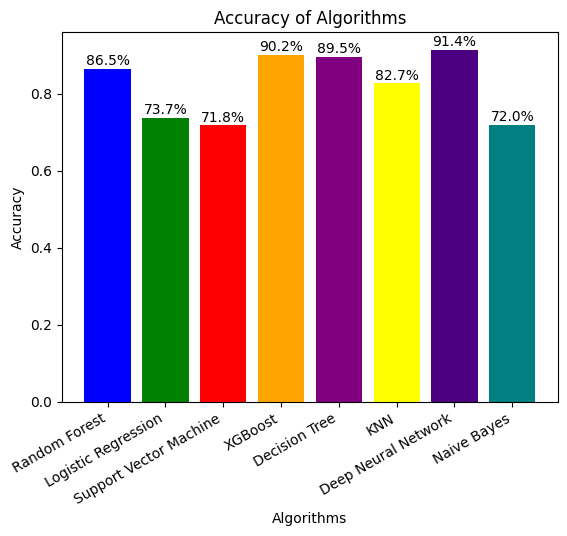

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

colors = ['blue', 'green', 'red', 'orange','purple','yellow','indigo','teal']
x_pos = np.arange(len(algorithms))

fig, ax = plt.subplots()

ax.bar(x_pos, list, color=colors)

for i, acc in enumerate(list):
    ax.text(x_pos[i], acc + 0.01, f'{acc*100:.1f}%', ha='center')

ax.set_xticks(x_pos)
ax.set_xticklabels(algorithms, rotation=30, ha='right')

ax.set_xlabel('Algorithms')
ax.set_ylabel('Accuracy')
ax.set_title('Accuracy of Algorithms')

plt.show()
